# Analysis of Han/Zorn 2020 foregut development data and integration with Wnt2 CPP data

### Import libraries

In [ ]:
# core libraries
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np

# sparse matrix support and statistics
import scipy
from scipy import stats
from scipy.stats import (
    hypergeom,
    rankdata
)

# plotting
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import rcParams

# don't print extraneous warnings
import warnings
warnings.filterwarnings("ignore")

# batch correction (harmony-pytorch)
from harmony import harmonize

# helpers
from natsort import natsorted
import time
import itertools
from itertools import combinations
import os
import re
from path import Path
import glob
from tqdm import tqdm
tqdm.pandas()

# plotting preferences
sc.set_figure_params(dpi=96, dpi_save=400, color_map="viridis")
rcParams["image.aspect"]     = "equal"
rcParams['patch.edgecolor']  = "black"
rcParams['font.family']      = "Arial"
rcParams['figure.facecolor'] = "white"
rcParams['svg.fonttype']     = "none"

# local directories to save outputs
#os.mkdir("figures")
#os.mkdir("tables")

### Define some useful global constants

In [37]:
# organism IDs
organism = "mmusculus"
orthologous_organism = ("mmusculus" if (organism=="hsapiens") else "hsapiens")
mixed_sex_samples = True # maybe?

# many algorithms rely on pseudorandom numbers - provide them with a known seed to reproduce results
random_state = 0

## Import the zorn data

In [3]:
meta_df = pd.read_csv(
    "../../data/GSE136689_MetaFile_AllCells_E8.5_E9.0_E9.5_Final.txt.gz",
    sep="\t",
    index_col=0
)
meta_df

,Cells.1,Stages,LineageAnnotations
Cells,,,
AAACCTGAGACTAAGT_E8.5,AAACCTGAGACTAAGT_E8.5,E8.5,Cardiac
AAACCTGAGAGATGAG_E8.5,AAACCTGAGAGATGAG_E8.5,E8.5,Ectoderm
AAACCTGAGAGCCCAA_E8.5,AAACCTGAGAGCCCAA_E8.5,E8.5,Ectoderm
AAACCTGAGATATACG_E8.5,AAACCTGAGATATACG_E8.5,E8.5,Other_Meso
AAACCTGAGCTGTCTA_E8.5,AAACCTGAGCTGTCTA_E8.5,E8.5,Ectoderm
...,...,...,...
TTTGTCAGTATAGGGC_E9.75,TTTGTCAGTATAGGGC_E9.75,E9.5Anterior,Spl_Meso
TTTGTCAGTTGATTCG_E9.75,TTTGTCAGTTGATTCG_E9.75,E9.5Anterior,Spl_Meso
TTTGTCATCAATACCG_E9.75,TTTGTCATCAATACCG_E9.75,E9.5Anterior,Blood


In [25]:
meta_df["Stages"].unique()

array(['E8.5', 'Filtered', 'E9.0', 'E9.5Posterior', 'E9.5Anterior'],
      dtype=object)

In [4]:
counts_df = pd.read_csv(
    "../../data/GSE136689_Counts_Matrix_AllCells_E8.5_E9.0_E9.5_Final.txt",
    sep="\t",
    index_col=0
)
counts_df

,AAACCTGAGACTAAGT_E8.5,AAACCTGAGAGATGAG_E8.5,AAACCTGAGAGCCCAA_E8.5,AAACCTGAGATATACG_E8.5,AAACCTGAGCTGTCTA_E8.5,AAACCTGAGGTAAACT_E8.5,AAACCTGAGTACGCGA_E8.5,AAACCTGAGTCCCACG_E8.5,AAACCTGAGTGAAGTT_E8.5,AAACCTGAGTGTTTGC_E8.5,...,TTTGTCACAATAGCGG_E9.75,TTTGTCACAATGGTCT_E9.75,TTTGTCACACATTTCT_E9.75,TTTGTCACACTATCTT_E9.75,TTTGTCACACTGTGTA_E9.75,TTTGTCAGTATAGGGC_E9.75,TTTGTCAGTTGATTCG_E9.75,TTTGTCATCAATACCG_E9.75,TTTGTCATCATCGCTC_E9.75,TTTGTCATCCGCGGTA_E9.75
Gene,,,,,,,,,,,,,,,,,,,,,
Gm8165,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Hif3a,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Glg1,0,1,0,2,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
Ptprs,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
Tnks,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cd276,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4930445B16Rik,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Prrg4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
a = ad.AnnData(
    obs = meta_df,
    var = pd.DataFrame(index = counts_df.index),
    X = scipy.sparse.csr.csr_matrix(counts_df.to_numpy().T)
)
a.obs["age"]   = [x.split("_")[1] for x in a.obs.index]
a.obs["batch"] = a.obs["Stages"]
a.obs["compartment"] = a.obs["LineageAnnotations"]
a.obs["publication"] = "Han_ZornLab_2020"

In [6]:
sc.pp.calculate_qc_metrics(a, inplace=True)

## Import the Wnt2 CPP data

In [7]:
b = ad.read_h5ad("../data/adata_zenodo.h5ad")
b.X = b.layers["counts_raw"]
b

AnnData object with n_obs × n_vars = 39611 × 22342
    obs: 'batch', 'age', 'species', 'organ', 'condition', 'disease', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'percent_mito', 'percent_ribo', 'percent_rRNA', 'percent_hemoglobin', 'n_genes', 'too_high_mito', 'size_factor', 'Xist_expression', 'sex', 'SOLO_predicted_doublet', 'sample', 'leiden', 'cell type', 'cluster cell type', 'age_condition', 'umap_density_age_condition', 'S_score', 'G2M_score', 'phase', 'umap_density_phase', 'EYFP+', 'age_organ', 'compartment', 'heart_celltype', 'heart_leiden', 'lung_celltype', 'lung_leiden', 'celltype'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'n_cells', 'ignore'
    uns: 'age_colors', 'age_condition_colors', 'batch_colors', 'cell type_colors', '

## Merge the datasets

In [45]:
adata = ad.concat([a,b], join="inner")

# add in Wnt2 paper annotations
for col in ["lung_celltype", "heart_celltype", "lung_leiden", "heart_leiden", "sex", "age", "batch", "species", "organ", "condition", "EYFP+", "compartment", "age_organ"]:
    if not(col in adata.obs.columns):
        adata.obs[col] = np.nan
    adata.obs.loc[b.obs.index, col] = b.obs[col]

adata.layers["counts_raw"] = adata.X.copy()
adata

AnnData object with n_obs × n_vars = 70922 × 16756
    obs: 'age', 'batch', 'compartment', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'publication', 'lung_celltype', 'heart_celltype', 'lung_leiden', 'heart_leiden', 'sex', 'species', 'organ', 'condition', 'EYFP+', 'age_organ'
    layers: 'counts_raw'

### Transfer over the EYFP expression

In [46]:
adata.obs["EYFP"] = np.nan
adata.obs.loc[b.obs.index, "EYFP"] = b.obs_vector("EYFP", layer="counts_raw")

## Print/plot QC statistics

Median values
facet: n_genes_by_counts, median: 3017.0
facet: log1p_total_counts, median: 9.082620620727539


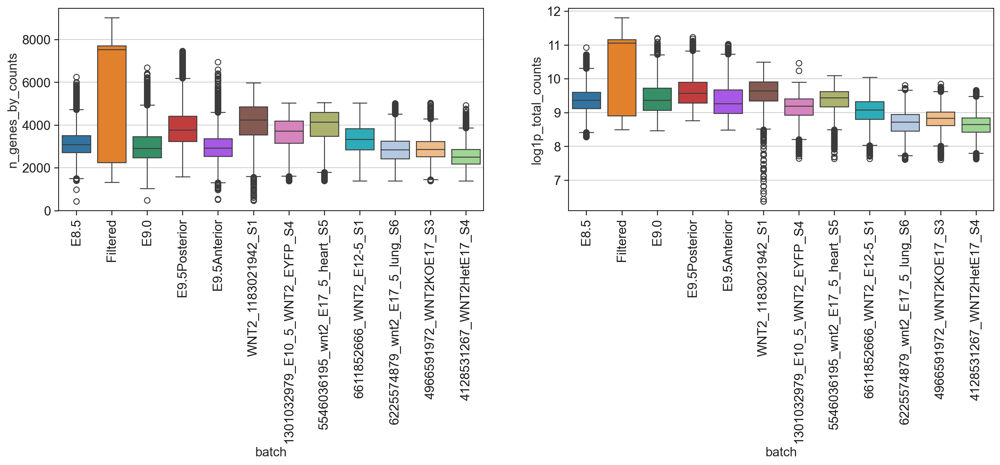

In [47]:
facets = ["n_genes_by_counts", "log1p_total_counts"]

fig, ax = plt.subplots(1,len(facets), figsize=(9 * len(facets),4))
for i in range(0, len(facets)):      
    sns.boxplot(y=facets[i], data=adata.obs, x="batch", hue="batch", ax=ax[i])
    ax[i].set_xticklabels(labels=ax[i].get_xticklabels(), rotation=90)

print("Median values")
for f in facets:
    print("facet: " + f + ", median: " + str(np.median(adata.obs[f])))

### Normalize and log-transform the counts

In [48]:
# target sum is debated in the field; Seurat uses 1e4 (10,000), 
# but has used 1e6 (1,000,000) in the past, which results in the 
# familiar CPM transformation 
sc.pp.normalize_total(adata, target_sum=1e4, key_added="size_factor", layer=None) #X

# do the ln(normalized_counts + 1) transformation 
sc.pp.log1p(adata, layer=None) #X

# copy the data to a layer as well
adata.layers["log1p(CP10k)"] = adata.X.copy()

### Remove blood and filtered cells, and annotate some genes to ignore

In [49]:
mask = adata.obs["compartment"].isin(["Blood"]) | adata.obs["batch"].isin(["Filtered"])
adata = adata[~mask]

In [11]:
def in_ignore_list(g):
    """
    Given a gene symbol `g`, return
    `True` if this gene is any of the following:
        * A mitochondrial gene
        * A ribosomal gene
        * A hemoglobin gene
        * A lncRNA gene
        * An antisense gene
        * A microRNA
        * An uncharacterized/predicted gene
    
    Parameters
    ----------
    g: str
        The gene symbol to test
    
    Returns
    -------
    bool
        True if g is in any of those categories,
        else False
    
    Usage
    -----
    '''
    >>> in_ignore_list("Gm12941")
    True
    >>> in_ignore_list("Actb")
    False
    >>> adata.var["ignore"] = [in_ignore_list(g) for g in adata.var.index]
    '''
    """
    
    to_ignore = [
        "MT-", "mt-", "RPL", "Rpl", "RPS", "Rps",
        "HBA", "Hba", "HBB", "Hbb", "LINC", "Lnc",
        "RP11", "Rp11", "-AS", "LOC", "n-R5", "-mir",
        "snopsi", "AC0", "XXbac", "Trn", "-DT"
        "-ps", "-ps1", "-ps2", 
        "ROSA", "Gt(ROSA)26Sor"
    ]
    
    regex_patterns_to_ignore = [
        "^Gm[0-9]{3,}", "[0-9]Rik",
        "^AU[0-9]{3,}", "^C[0-9]{1,}orf[0-9]{1,}", 
        "^RP[0-9]{1,}-[0-9]{1,}", "^Rp[0-9]{1,}-[0-9]{1,}",
        "^CT[A-Z]-[0-9]{1,}", "^A[A-Z][0-9]{1,}"
    ]
    
    # first search for brute-forcable substrings
    for x in to_ignore:
        if (x in g):
            return True
        
    # then, if none above are matches, check for complex (regex-needed) substrings
    for pattern in regex_patterns_to_ignore:
        if (re.search(pattern, g)):
            return True
    
    # no matches found
    return False

In [50]:
adata.var["ignore"] = adata.var.index.map(in_ignore_list)

## Save/load the integrated data

In [ ]:
adata.write_h5ad("adata_Frank_Zorn_integrated_processed.h5ad", compression="gzip")

In [38]:
adata = ad.read_h5ad("adata_Frank_Zorn_integrated_processed.h5ad")

## Project and cluster the data

### Select highly variable genes

In [51]:
# we previously used the cell_ranger HVG identification, but most groups have moved to the seurat_v3
# strategy which is slightly better
sc.pp.highly_variable_genes(adata, n_top_genes=2000, layer="counts_raw", flavor="seurat_v3", batch_key="batch")

# remove SiteA/SiteB from highly variable list
adata.var.loc[adata.var.index.isin(["SiteA", "SiteB", "tdTomato", "tdTomato_orig", "EYFP", "EFYP"]), "highly_variable"] = False

### Do a PCA and aggressively batch-correct it using harmony-pytorch

#### Batch corrected PCA

In [52]:
from harmony import harmonize

sc.tl.pca(adata, svd_solver='arpack', n_comps=50, random_state=0, use_highly_variable=True) 

if (len(adata.obs["batch"].unique()) > 1):
    Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key=["batch"], random_state=0)
    adata.obsm['X_pca_original'] = adata.obsm["X_pca"]
    adata.obsm["X_pca"] = Z

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).


### Calculate a cell-cell neighborhood network

In [53]:
# There are a few options for setting n_neighbors
# `n_neighbors = 20` is a decent starting point, but
# the heuristic used below often scales better across
# datasets of varying sizes

# In general, larger n_neighbors -> larger cluster sizes
# when we perform clustering and UMAP projections

n_neighbors = int(0.25 * np.sqrt(len(adata.obs)))
# n_neighbors = 20
print("n_neighbors = " + str(n_neighbors)) 

sc.pp.neighbors(adata, n_neighbors=n_neighbors, random_state=random_state)

n_neighbors = 65


### Calulate the UMAP

In [54]:
# `init_pos = "spectral"` results in the generation of slightly more
# logical UMAP layouts, but is not fully reproducible - use 
# `init_pos = "random"` for guaranteed reproducibility with a given random_seed

sc.tl.umap(adata, random_state=random_state, init_pos="spectral")

### Identify cell clusters

In [55]:
# To increase clustering resolution (i.e. make more, smaller clusters),
# increase the value of the resolution parameter.
# Default in scanpy is `resolution = 1`
# Commonly useful range is `resolution ~ [0.1, 2.5]`

resolution = 0.5

sc.tl.leiden(adata, resolution=resolution, random_state=random_state)
sc.tl.leiden(adata, resolution=1.5, random_state=random_state, key_added="leiden_high_res")
sc.tl.leiden(adata, resolution=0.2, random_state=random_state, key_added="leiden_low_res")

### Plot the results and inspect

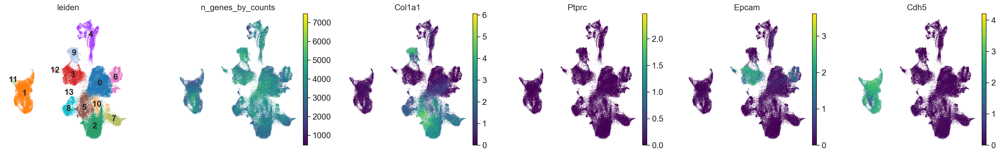

In [56]:
sc.pl.umap(adata, color=["leiden", "n_genes_by_counts", "Col1a1", "Ptprc", "Epcam", "Cdh5"], legend_loc="on data", frameon=False, ncols=7)

### Lift-over annotations from each dataset

#### Celltype

In [ ]:
# pull in Wnt2 CPP celltype annotations
adata.obs["celltype"] = np.nan
adata.obs.loc[b.obs.index, "celltype"] = b.obs["cell type"]

In [163]:
# use the refined celltypes when available (E17.5, organ-specific dissections)
mask = ~b.obs["heart_celltype"].isna()
adata.obs.loc[b[mask].obs.index, "celltype"] = b.obs["heart_celltype"]
mask = ~b.obs["lung_celltype"].isna()
adata.obs.loc[b[mask].obs.index, "celltype"] = b.obs["lung_celltype"]

In [167]:
adata.obs["celltype_reported"] = adata.obs["celltype"].copy()
adata.obs["celltype"] = adata.obs["celltype"].astype(str)

In [168]:
# fill in Zorn 2020 annotations as best we can using compartment they reported
mask = (adata.obs["celltype_reported"].isin(["nan", np.nan]))
adata.obs.loc[mask, "celltype"] = adata[mask].obs["compartment_reported"]

In [ ]:
# merge a few celltype annotations
adata.obs.loc[adata.obs["celltype"] == "Endothelial", "celltype"] = "Capillary EC"
adata.obs.loc[adata.obs["celltype"].isin(["Epicardium"]), "celltype"] = "Peri/Epicardium"
adata.obs.loc[adata.obs["celltype"].isin(["Proliferating mesoderm"]), "celltype"] = "Proliferating Mesoderm"
adata.obs.loc[adata.obs["celltype"].isin(["Early lung/Wnt2+ Mesoderm"]), "celltype"] = "Early Lung/Wnt2+ Mesoderm"
adata.obs.loc[adata.obs["celltype"].isin(["Ventricle CM"]), "celltype"] = "Ventricle CM1"

#### Compartment

In [162]:
adata.obs["compartment_reported"] = adata.obs["compartment"].copy()

In [71]:
compartment_remap_dict = {"Cardiac": "Myocardial", "Other_Meso": "Mesodermal", "Spl_Meso": "Mesodermal"}
adata.obs["compartment"] = adata.obs["compartment_reported"].apply(lambda x: compartment_remap_dict[x] if (x in compartment_remap_dict.keys()) else x)
adata.obs["compartment"] = adata.obs["compartment"].astype(str).astype("category")

#### Age

In [164]:
adata.obs["age_reported"] = adata.obs["age"].copy()

In [165]:
age_remap_dict = {"E8.75": "E8.5", "E9.75": "E9.5", "E17": "E17.5"}
adata.obs["age"] = adata.obs["age_reported"].apply(lambda x: age_remap_dict[x] if (x in age_remap_dict.keys()) else x)
adata.obs["age"] = adata.obs["age"].astype(str).astype("category").cat.reorder_categories(["E8.5", "E9.5", "E10.5", "E12.5", "E17.5"])

In [166]:
adata.uns["age_colors"] = [matplotlib.colors.rgb2hex(plt.cm.plasma_r(i/len(adata.obs["age"].unique())), keep_alpha=False) for i in range(0, len(adata.obs["age"].unique()))]

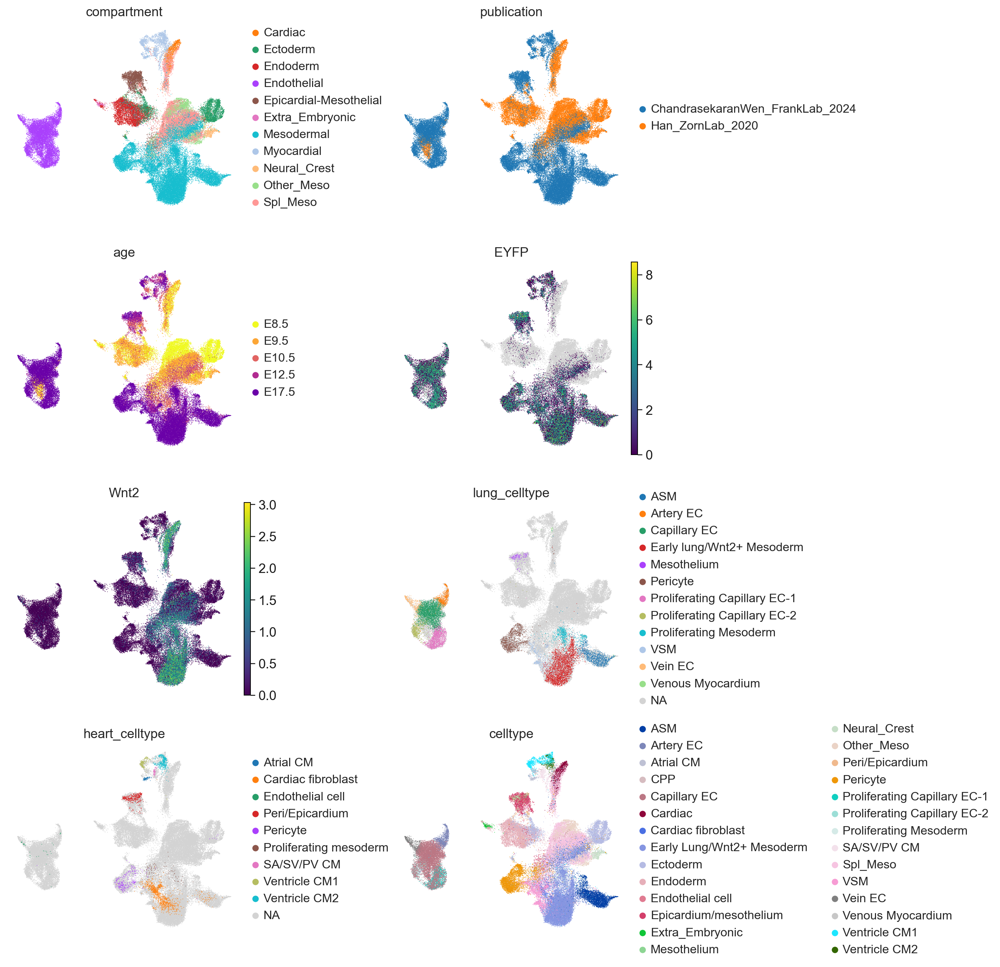

In [169]:
sc.pl.umap(adata, color=["compartment", "publication", "age", "EYFP", "Wnt2", "lung_celltype", "heart_celltype", "celltype"], frameon=False, ncols=2, wspace=0.5)

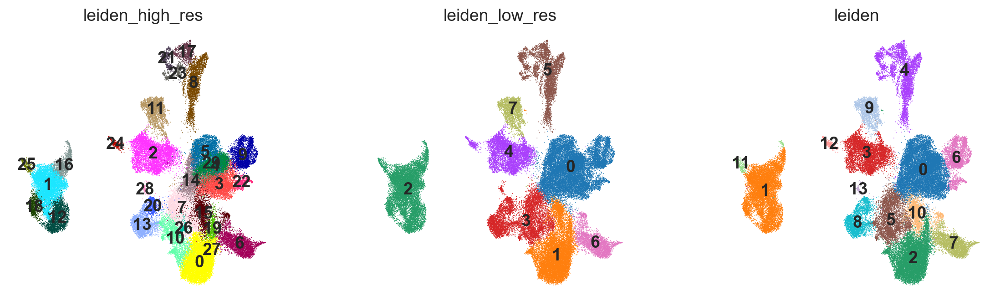

In [120]:
sc.pl.umap(adata, color=["leiden_high_res", "leiden_low_res", "leiden"], frameon=False, ncols=3, legend_loc="on data")

#### TF-IDF marker gene test
This is QuickMarkers from SoupX, re-implemented in python. It's helpful to quickly identify highly specific marker genes, and we use it here just to highlight some.

In [ ]:
def tf_idf_markers(
    adata: ad.AnnData, 
    groupby: str, 
    n_genes: int = 10, 
    n_genes_to_plot: int = 10, 
    redo_threshold: bool = False,
    dendrogram: bool = False, 
    save_markers: bool = False, 
    return_fig: bool = False,
    var_key_to_ignore: str = None,
    **kwargs
):
    """
    Performs term-frequency, inverse-document frequency 
    calculation in order to rank marker genes across
    groups in groupby. This is an alternative to mean expression
    based DEG testing that prioritizes uniqueness of genes 
    over fold-change in expression across groups. 
    
    Parameters
    ---------
    adata: ad.AnnData
        The anndata object for this experiment
    
    groupby: str
        The column in adata.obs that we will split the 
        data on for the TF-IDF test. 
        
    n_genes: int > 0 (default: 10)
        The number of top genes per group to return 
        in the marker gene dictionary
    
    n_genes_to_plot: int in range (0, n_genes] (default: 10)
        The number of genes per group to plot in the 
        resulting dotplot. Set to 0 to disable plot generation.
    
    redo_threshold: bool (default: False)
        If :code:`adata.layers["binary"]` exists, redo the 
        calculation of the binary matrix. Possibly useful 
        when performing TF-IDF ranking on a subset of adata.
        
    save_markers: bool (default: False)
        If True, store the marker gene matrix in the adata
        object as :code:`adata.uns["TF_IDF_" + groupby]`
            
    return_fig: bool (default: False)
        If True, output of this function changes to a tuple
        of dict, dpl (dotplot object from scanpy) instead
        of just dict. Otherwise, dotplot is generated and
        shown but not returned from this function.
    
    var_key_to_ignore: str (default: None)
        The name of a boolean column in adata.var which
        indicates genes that should be ignored during marker
        gene testing (often mitochondrial genes, pseudogenes,
        ribosomal genes, etc.). If `None`, no gene masking
        is performed.
        
    kwargs:
        Arguments passed to :code:`sc.pl.dotplot` 
        (if `n_genes_to_plot>0`)

    Returns
    -------
    marker_dict: dict
        The marker gene dictionary. 
        Keys are :code:`adata.obs[groupby].unique()`
    
    dpl: sc.pl.DotPlot (optional)
        If :code:`plot is True` and :code:`return_fig is True`, 
        scanpy DotPlot object is also returned for 
        further processing/saving.
    
    References
    ----------

    * https://github.com/constantAmateur/SoupX
    * https://doi.org/10.1093/gigascience/giaa151
    * https://constantamateur.github.io/2020-04-10-scDE
    """

    # binarize the gene expression data
    if ((redo_threshold) 
    or ("binary" not in adata.layers.keys())):
        threshold = np.percentile(adata.X.data, 5)
        X = adata.X.copy()
        X.data = np.where(adata.X.data > threshold, 1, 0)
        adata.layers["binary"] = X.copy().astype(np.bool_)
        del X
    
    # get gene (var) mask
    if (var_key_to_ignore in adata.var.columns):
        gene_mask = ~adata.var[var_key_to_ignore].astype(np.bool_)
    else:
        gene_mask = np.array([True for x in adata.var.index])
    
    # calculate the TF matrix
    clusters = adata.obs[groupby].astype("category").cat.categories
    X_clust  = []
    for c in clusters:
        cell_mask = adata.obs[groupby] == c
        expression = np.squeeze(
            np.asarray(
                np.sum(adata[cell_mask, gene_mask].layers["binary"], axis=0)
            )
        )
        X_clust.append(expression)
    cluster_max = np.max(X_clust, axis=1)
    TF = np.asarray(X_clust).T / cluster_max
    TF = TF.T
    
    # calculate the IDF vector
    n_cells = len(adata.obs.index)
    n_cells_expressing_gene = adata[:, gene_mask].layers["binary"].getnnz(axis=0)
    IDF = (np.log2((n_cells + 1) / (n_cells_expressing_gene + 1)))
    
    # calculate the TF-IDF matrix (marker gene scores)
    TF_IDF = TF * IDF
    TF_IDF = pd.DataFrame(
        data=TF_IDF, 
        index=clusters, 
        columns=adata[:, gene_mask].var.index.tolist()
    ).T
    if (save_markers):
        adata.uns["TF_IDF_" + groupby] = TF_IDF
    
    """
    Do hypergeometric test to assign p-values to this
    distribution of gene-cluster frequencies.
    M is the total number of objects, 
    n is total number of Type I objects. 
    N is the number of items selected/draws
    k is the observed number of Type I objects selected/drawn

    Suppose we have a collection of 20 genes, of which 7 are DEGs. 
    Then if we want to know the probability of finding a given number 
    of DEGs if we choose at random 12 of the 20 genes, we can 
    initialize a frozen distribution and plot the probability mass function:
    [M, n, N] = [20, 7, 12]
    """

    k = TF
    M = n_cells
    n = n_cells_expressing_gene
    N = cluster_max
    pvals = {}
    adjusted_pvals  = {}
    for i, c in enumerate(clusters):
        pvals[c] = hypergeom.pmf(k[i], M, n, N[i])
        adjusted_pvals[c]  = _bh_correct(pvals[c])
    adjusted_pvals = pd.DataFrame.from_dict(
        adjusted_pvals, 
        orient="index", 
        columns=adata[:, gene_mask].var.index.tolist()
    ).T
    
    # get the top N genes for each cluster
    target_fdr = 0.05
    top_genes = {}
    top_adjusted_pvals  = {}
    for i, c in enumerate(clusters):
        mask = adjusted_pvals[c] <= target_fdr
        df = TF_IDF[mask].sort_values(c, ascending=False).head(n_genes)
        genes = df.index.tolist()
        genes_idx = [adata[:, gene_mask].var.index.get_loc(g) for g in genes]
        top_genes[c] = genes
        top_adjusted_pvals[c]  = adjusted_pvals[c][genes_idx]
    
    if (n_genes_to_plot > 0):
        if (0 < n_genes_to_plot < n_genes):
            plot_me = {}
            for k in clusters:
                plot_me[k] = top_genes[k][0:n_genes_to_plot]
        else:
            plot_me = top_genes

        dpl = sc.pl.dotplot(
            adata, 
            plot_me, 
            groupby=groupby, 
            dendrogram=dendrogram,
            return_fig=True,
            **kwargs
        )
        dpl.add_totals(color="lightgray").style(cmap="Reds")
        
        if (return_fig):
            return top_genes, dpl
        else:
            dpl.show()
    
    return top_genes


def _bh_correct(
    pvals: np.array
):
    """
    Perform Benjamini-Hochberg p-value adjustment
    for multiple comparisons.

    Parameters
    ----------

    pvals: np.array (in range [0,1])
        The uncorrected p-values

    Returns
    -------

    adjusted_pvals: np.array (in range [0,1])
        The BH adjusted p-values
    """

    ranked_pvals = rankdata(pvals)
    adjusted_pvals = pvals * len(pvals) / ranked_pvals
    adjusted_pvals[adjusted_pvals > 1] = 1
    return adjusted_pvals

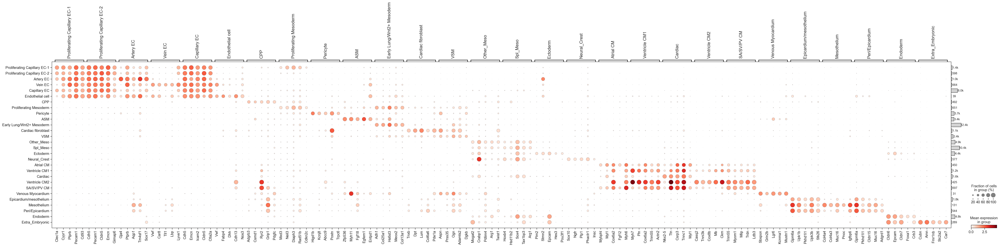

In [157]:
sc.tl.dendrogram(adata, "celltype")
m = tf_idf_markers(adata, "celltype", dendrogram=True, n_genes_to_plot=5)

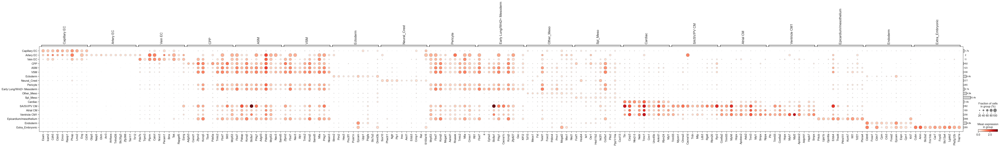

In [8]:
a = adata[adata.obs["age"].isin(["E8.5", "E9.5", "E10.5"])]
sc.tl.dendrogram(a, "celltype")
m = tf_idf_markers(a, "celltype", dendrogram=True, n_genes_to_plot=10)
del a

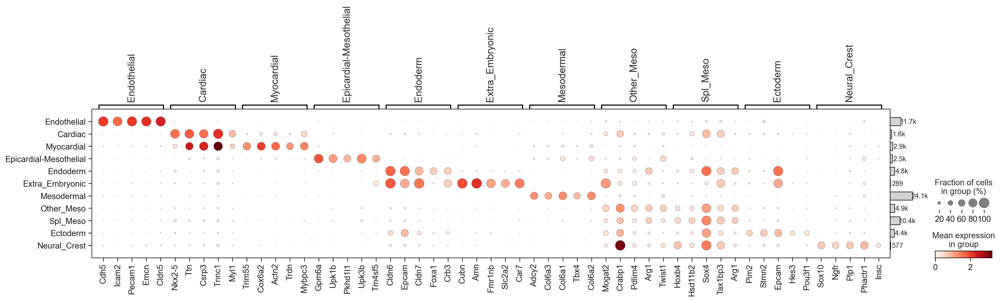

In [102]:
m = tf_idf_markers(adata, "compartment_reported", dendrogram=True, n_genes_to_plot=5)

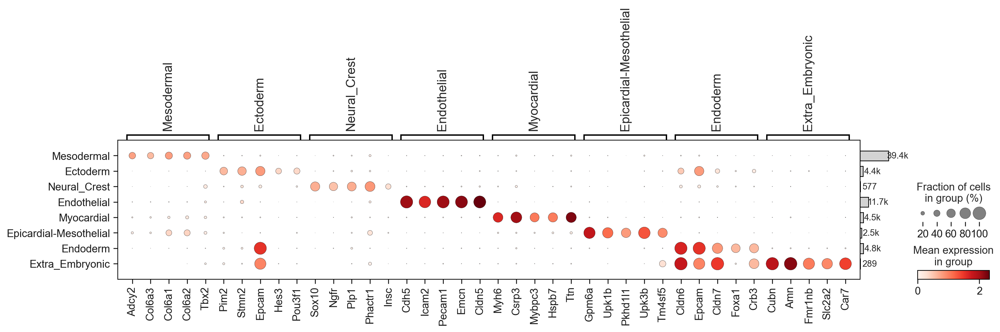

In [103]:
m = tf_idf_markers(adata, "compartment", dendrogram=True, n_genes_to_plot=5)

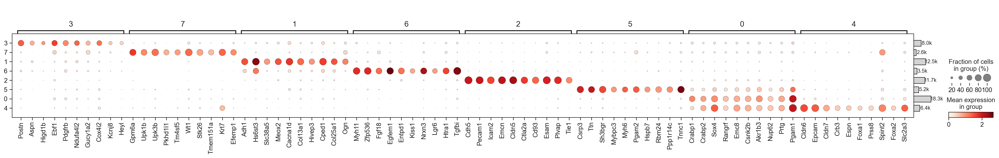

In [65]:
m = tf_idf_markers(adata, "leiden_low_res", dendrogram=True)

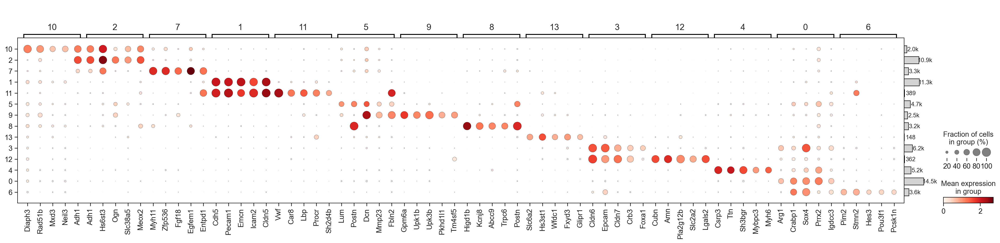

In [64]:
m = tf_idf_markers(adata, "leiden", n_genes_to_plot=5, dendrogram=True)

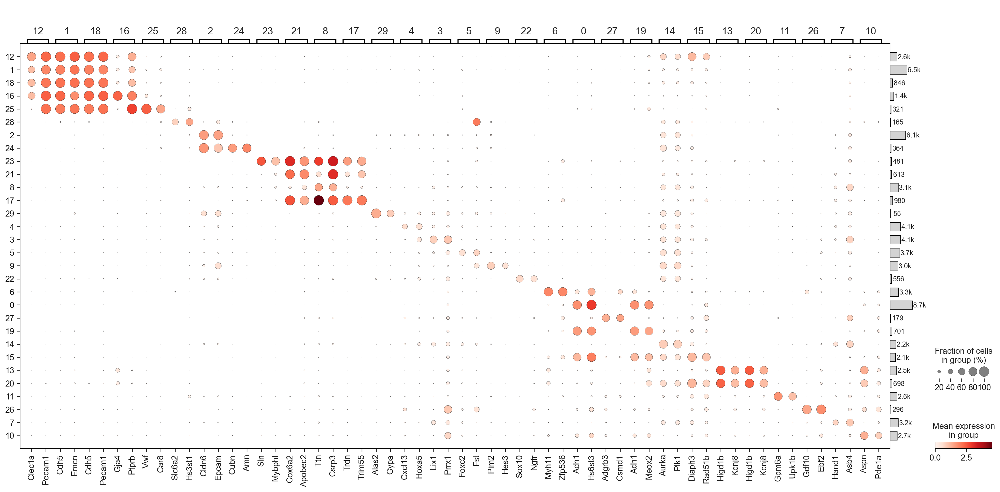

In [63]:
m = tf_idf_markers(adata, "leiden_high_res", n_genes_to_plot=2, dendrogram=True)

## Estimate cell cycle phase

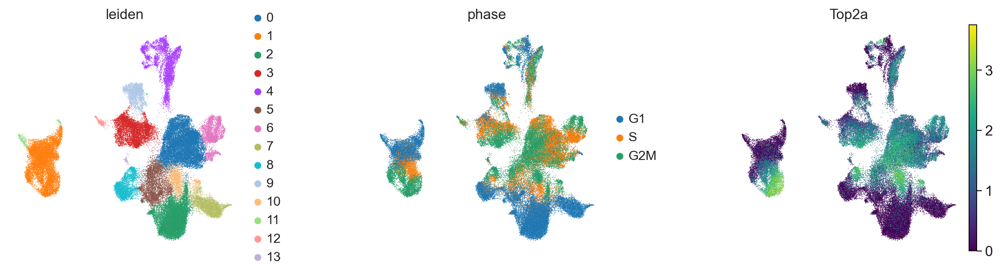

In [66]:
cell_cycle_gene_df = pd.read_csv(
    "../data/cell_cycle_genes.csv",
    sep=",",
    index_col=1
).dropna()

g2m_genes = cell_cycle_gene_df[cell_cycle_gene_df["phase"]=="G2/M"][organism + "_symbol"].tolist()
s_genes   = cell_cycle_gene_df[cell_cycle_gene_df["phase"]=="S"][organism + "_symbol"].tolist()

sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
adata.obs["phase"] = adata.obs["phase"].astype("category")
adata.obs["phase"] = adata.obs["phase"].cat.reorder_categories(["G1", "S", "G2M"])

sc.pl.umap(adata, color=["leiden", "phase", "Top2a"], cmap=continuous_cmap, wspace=0.4, frameon=False)

## Show where the CPPs project in the UMAP

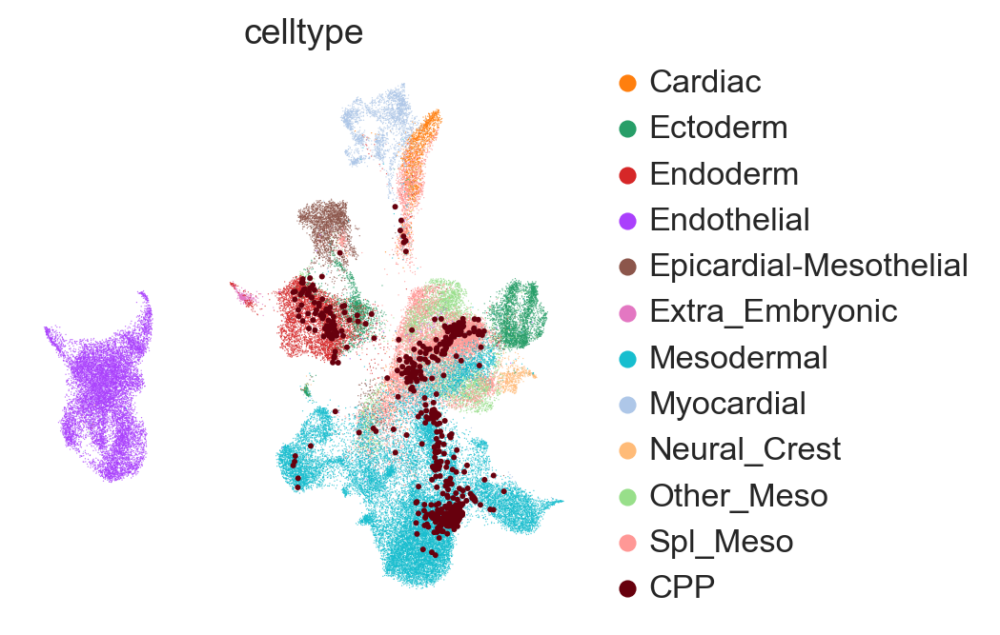

In [83]:
mask = adata.obs["celltype"].isin(["CPP"])

fig, ax = plt.subplots(1,1)

sc.pl.umap(adata, color=["compartment"], ncols=1, frameon=False, ax=ax, size=1, show=False, alpha=0.75)
sc.pl.umap(adata[mask], color=["celltype"], ncols=1, frameon=False, ax=ax, size=20, palette="Reds_r", save="Zorn_Frank_CPP_highlighted.svg")

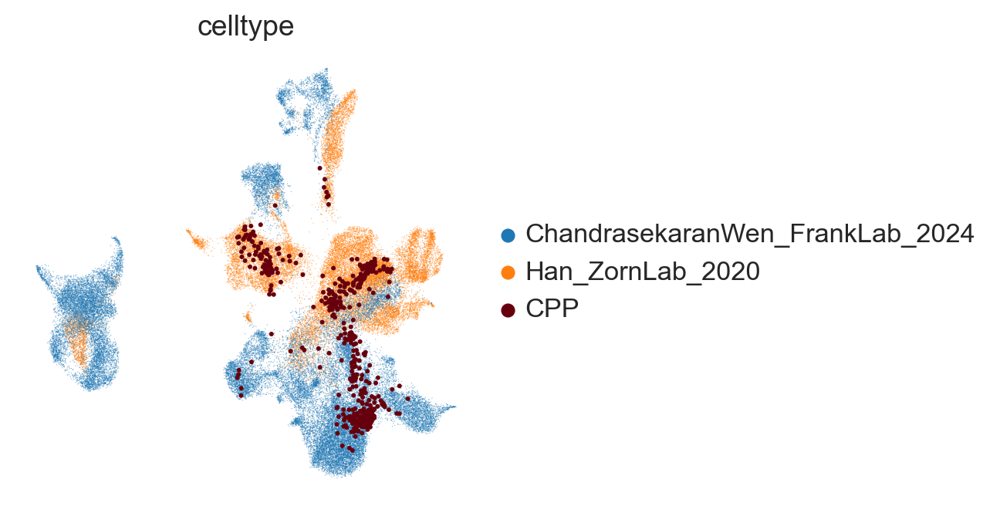

In [84]:
mask = adata.obs["celltype"].isin(["CPP"])

fig, ax = plt.subplots(1,1)

sc.pl.umap(adata, color=["publication"], ncols=1, frameon=False, ax=ax, size=1, show=False, alpha=0.5)
sc.pl.umap(adata[mask], color=["celltype"], ncols=1, frameon=False, ax=ax, size=20, palette="Reds_r", save="Zorn_Frank_CPP_highlighted_publication.svg")

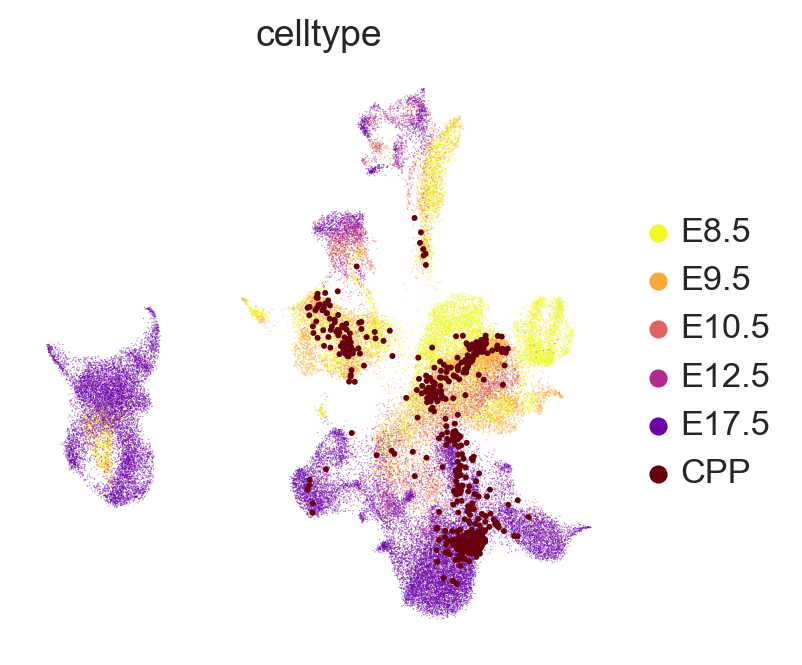

In [85]:
mask = adata.obs["celltype"].isin(["CPP"])

fig, ax = plt.subplots(1,1)

sc.pl.umap(adata, color=["age"], ncols=1, frameon=False, ax=ax, size=1, show=False, alpha=0.5)
sc.pl.umap(adata[mask], color=["celltype"], ncols=1, frameon=False, ax=ax, size=20, palette="Reds_r", save="Zorn_Frank_CPP_highlighted_age.svg")